In [9]:
import json
with open("save/poses/val_seen_pose.json") as f:
    scan_vp_poses = json.load(f)

In [16]:
from collections import defaultdict

scan2vps = defaultdict(list)
for vp in scan_vp_poses["poses"]:
    scan2vps[vp["scan"]].append(vp) 

In [19]:
with open("save/poses/val_seen_scan2vpspose.json", "w") as f:
    json.dump(scan2vps, f)

In [1]:
# check test_clip_mesh.py for the code where meshes are clipped on gpu
# in this notebook, we clip meshes on cpu and push to gpu for rendering

In [1]:
# imports
# load a pose
import json
import os
import resource
import sys

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from pytorch3d.renderer import (
    AmbientLights,
    FoVPerspectiveCameras,
    HardPhongShader,
    MeshRasterizer,
    MeshRenderer,
    RasterizationSettings,
    SoftPhongShader,
    look_at_view_transform,
)
from pytorch3d.renderer.mesh.clip import ClipFrustum, clip_faces
from pytorch3d.renderer.mesh.textures import TexturesAtlas
from pytorch3d.structures import Meshes
from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene
from torch.profiler import ProfilerActivity, profile, record_function


In [2]:
cd ..

/home/zijiao/research/pytorch_rend


In [3]:

from render.config import cfg
from render.render import get_render_params, init_episode, load_meshes
from render.utils import get_device, get_viewpoint_info, load_viewpoints_dict


In [4]:
%reload_ext autoreload 
%autoreload 2

In [5]:
cfg.merge_from_file("render_example/configs/mp3d_render.yaml")

In [6]:
with open(cfg.DATA.POSE) as f:
    scan2vpspose = json.load(f)

_, _, scan_to_vps_to_data = load_viewpoints_dict(cfg.DATA.CONNECTIVITY_DIR)

scan = "EU6Fwq7SyZv"
# vp = '49b4f59afc74417d846ad8cf1634e3d8'
test_render_set = scan2vpspose[scan]
vp = test_render_set[0]["vp"]
heading = test_render_set[0]["heading"]
elevation = test_render_set[0]["elevation"]

# vp2 = test_render_set[2]["vp"]
# heading2 = test_render_set[2]["heading"]
# elevation2 = test_render_set[2]["elevation"]

batch_size = 1
min_batch_size = min(batch_size, len(test_render_set))
if min_batch_size < batch_size:
    print(f"batch size {batch_size} too large, using {min_batch_size} instead.")

vps, headings, elevations = [], [], []
for view in test_render_set[:batch_size]:
    vps.append(view["vp"])
    headings.append(view["heading"])
    elevations.append(view["elevation"])

device = get_device()


In [7]:

mesh_data = load_meshes(
    [scan],
    mesh_dir=cfg.DATA.MESH_DIR,
    device=device,
    texture_atlas_size=cfg.MESH.TEXTURE_ATLAS_SIZE,
    with_atlas=False,
)

In [8]:
viewpoint_info = get_viewpoint_info(scan, vps[0], scan_to_vps_to_data)

# get original mesh
# -------------------------------------------
verts, faces, aux = mesh_data[scan]

atlas = aux.texture_atlas.to(device)
verts = verts.to(device)
faces = faces.to(device)

verts_rep = verts.expand(min_batch_size, -1, -1)
faces_rep = faces.expand(min_batch_size, -1, -1)
textures_rep = atlas.expand(min_batch_size, -1, -1, -1, -1)

textures = TexturesAtlas(atlas=textures_rep)

meshes = Meshes(
    verts=verts_rep,
    faces=faces_rep,
    textures=textures,
)
ambient_color = torch.tensor([1.0, 1.0, 1.0], requires_grad=False)
light = AmbientLights(device=device, ambient_color=ambient_color[None, :])
# set up renderer and intial view
pose = viewpoint_info["pose"]

In [9]:
raster_settings = RasterizationSettings(
    image_size=((cfg.CAMERA.HEIGHT, cfg.CAMERA.WIDTH)),
    blur_radius=0.0,
    faces_per_pixel=1,
    # cull_to_frustum=cull_to_frustum,
    perspective_correct=True,
    cull_to_frustum=True,
)


In [10]:
render_params = get_render_params(
    pose,
    headings,
    elevations,
    raster_settings=raster_settings,
    cfg=cfg,
    device=device,
)


In [11]:

# get renderer
camera = render_params["cameras"]
raster_settings = render_params["raster_settings"]
# device = render_params["device"]
light = render_params["light"]

rasterizer = MeshRasterizer(raster_settings=raster_settings)

renderer = MeshRenderer(
    rasterizer=rasterizer,
    shader=SoftPhongShader(device=device, lights=light),
)

# initial_memory_allocated = torch.cuda.memory_allocated()
# initial_memory_reserved = torch.cuda.memory_reserved()

images = renderer(meshes, cameras=camera)

# end_memory_allocated = torch.cuda.memory_allocated()
# end_initial_memory_reserved = torch.cuda.memory_reserved()
# print(
#     f"memory allocated: {(end_memory_allocated - initial_memory_allocated)/1024**2} MB"
# )
# print(
#     f"memory reserved: {(end_initial_memory_reserved - initial_memory_reserved)/1024**2} MB"
# )

In [12]:
def read_image(scan, vp, heading, elevation, display=False):
    # find image and display for compare
    img_path = os.path.join(
        cfg.SAVE.IMAGE_DIR, scan, f"{scan}_{vp}_{heading}_{elevation}.png"
    )
    img = Image.open(img_path)
    print("Image size:", img.size)
    if display:
        img.show()
    return img

In [13]:
imf = read_image(scan, vp, headings[0], elevations[0], display=True)

Image size: (640, 480)


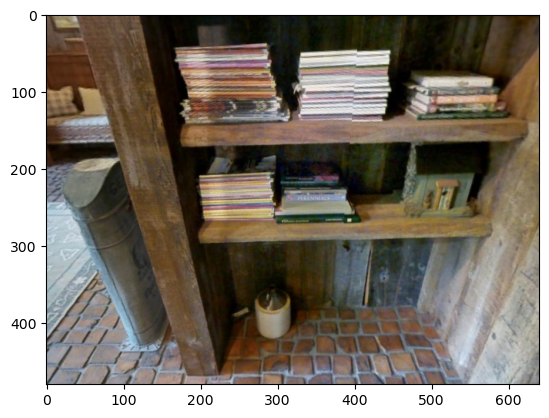

In [14]:
plt.imshow(imf)

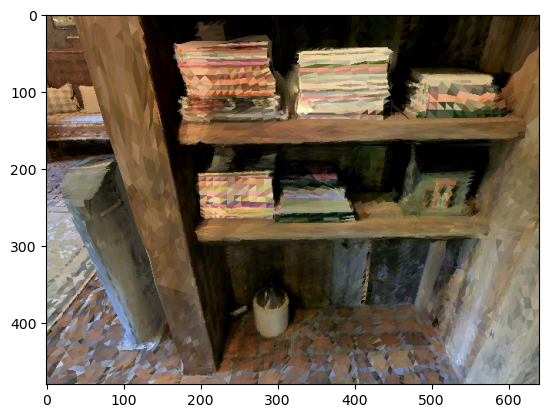

In [15]:
plt.imshow(images[0, ..., :3].cpu().numpy())

# transform to ndc and transform back.

In [64]:
xyz = meshes.verts_packed()
meshes_ndc = rasterizer.transform(meshes, cameras=camera)
xyz_ndc = meshes_ndc.verts_packed()
xyz_unproject = camera.unproject_points(xyz_ndc, world_coordinates=True, from_ndc=True)

In [37]:
def transform(meshes_world, **kwargs) -> torch.Tensor:
    """
    Args:
        meshes_world: a Meshes object representing a batch of meshes with
            vertex coordinates in world space.

    Returns:
        meshes_proj: a Meshes object with the vertex positions projected
        in NDC space
        inverse_transform: a Transform3d object representing the inverse transformation

    NOTE: keeping this as a separate function for readability but it could
    be moved into forward.
    """
    cameras = kwargs.get("cameras", self.cameras)
    if cameras is None:
        msg = "Cameras must be specified either at initialization \
            or in the forward pass of MeshRasterizer"
        raise ValueError(msg)

    n_cameras = len(cameras)
    if n_cameras != 1 and n_cameras != len(meshes_world):
        msg = "Wrong number (%r) of cameras for %r meshes"
        raise ValueError(msg % (n_cameras, len(meshes_world)))

    verts_world = meshes_world.verts_padded()

    # NOTE: Retaining view space z coordinate for now.
    # TODO: Revisit whether or not to transform z coordinate to [-1, 1] or
    # [0, 1] range.
    eps = kwargs.get("eps", None)
    # * 1. world to camera
    verts_view = cameras.get_world_to_view_transform(**kwargs).transform_points(
        verts_world, eps=eps
    )
    to_ndc_transform = cameras.get_ndc_camera_transform(**kwargs)
    projection_transform = try_get_projection_transform(cameras, kwargs)
    if projection_transform is not None:
        projection_transform = projection_transform.compose(to_ndc_transform)
        # * 2. camera to ndc
        verts_ndc = projection_transform.transform_points(verts_view, eps=eps)
    else:
        # Call transform_points instead of explicitly composing transforms to handle
        # the case, where camera class does not have a projection matrix form.
        verts_proj = cameras.transform_points(verts_world, eps=eps)
        verts_ndc = to_ndc_transform.transform_points(verts_proj, eps=eps)

    verts_ndc[..., 2] = verts_view[..., 2]
    meshes_ndc = meshes_world.update_padded(new_verts_padded=verts_ndc)
    return meshes_ndc

In [19]:
meshes_ndc = rasterizer.transform(meshes, cameras=camera)
verts_packed = meshes_ndc.verts_packed()
faces_packed = meshes_ndc.faces_packed()
face_verts = verts_packed[faces_packed]
mesh_to_face_first_idx = meshes_ndc.mesh_to_faces_packed_first_idx()
num_faces_per_mesh = meshes_ndc.num_faces_per_mesh()

In [20]:

cull_to_frustum = True
perspective_correct = True
# TODO: consider a better way of setting the bin size.
frustum = ClipFrustum(
    left=-1.5,
    right=1.5,
    top=-1.5,
    bottom=1.5,
    perspective_correct=perspective_correct,
    # z_clip_value=z_clip_value,
    cull=cull_to_frustum,
)


In [21]:

clipped_faces = clip_faces(
    face_verts, mesh_to_face_first_idx, num_faces_per_mesh, frustum=frustum
)
face_verts = clipped_faces.face_verts
mesh_to_face_first_idx = clipped_faces.mesh_to_face_first_idx
num_faces_per_mesh = clipped_faces.num_faces_per_mesh

In [22]:
flattened_verts = face_verts.view(-1, 3)
verts, indices = torch.unique(flattened_verts, dim=0, return_inverse=True)
faces = indices.view(-1, 3)

In [23]:
texture = meshes.textures
clipped_texture = torch.index_select(texture.atlas_packed(), 0, clipped_faces.faces_clipped_to_unclipped_idx)  # type: ignore

clipped_atlas = TexturesAtlas(atlas=clipped_texture.unsqueeze(0))

In [24]:
verts_world = camera.unproject_points(verts, world_coordinates=True, from_ndc=True)

In [25]:
clipped_mesh = Meshes(
    verts=verts_world.unsqueeze(0),
    faces=faces.unsqueeze(0),
    textures=clipped_atlas,
)

In [26]:
im = renderer(clipped_mesh, cameras=camera)

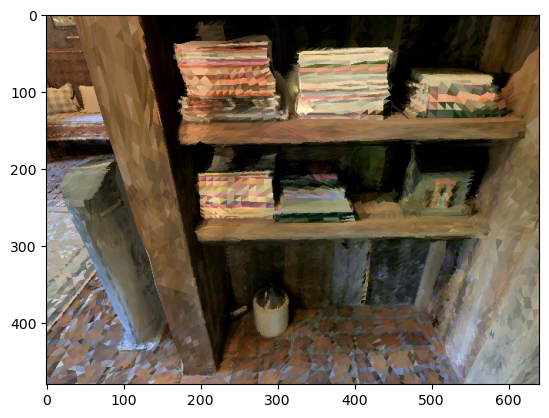

In [47]:
plt.imshow(images[0, ..., :3].cpu().numpy())

In [27]:
clipped_mesh_clone = clipped_mesh.clone()

In [48]:
from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene

In [28]:
meshes.faces_packed().shape, clipped_mesh.faces_packed().shape

(torch.Size([552549, 3]), torch.Size([65697, 3]))

In [49]:
fig = plot_scene({
    "subplot1": {
        "mesh": clipped_mesh
    }
})
fig.show()

In [ ]:
Meshes.verts_packed

In [ ]:
# if I on cpu rasterize mesh, then push to gpu for rendering, can I still backprop to the mesh?
# or do i have to get a complete culled mesh on cpu then push to gpu for rendering?

In [15]:
# Copyright (c) Meta Platforms, Inc. and affiliates.
# All rights reserved.
#
# This source code is licensed under the BSD-style license found in the
# LICENSE file in the root directory of this source tree.

import os
import unittest
from numbers import Real
from pathlib import Path
from typing import Callable, Optional, Union

import numpy as np
import torch
from PIL import Image


def interactive_testing_requested() -> bool:
    """
    Certain tests are only useful when run interactively, and so are not regularly run.
    These are activated by this funciton returning True, which the user requests by
    setting the environment variable `PYTORCH3D_INTERACTIVE_TESTING` to 1.
    """
    return os.environ.get("PYTORCH3D_INTERACTIVE_TESTING", "") == "1"


def get_tests_dir() -> Path:
    """
    Returns Path for the directory containing this file.
    """
    return Path(__file__).resolve().parent


# def get_pytorch3d_dir() -> Path:
#     """
#     Returns Path for the root PyTorch3D directory.

#     Meta internal systems need a special case here.
#     """
#     if os.environ.get("INSIDE_RE_WORKER") is not None:
#         return Path(__file__).resolve().parent.parent
#     elif os.environ.get("CONDA_BUILD_STATE", "") == "TEST":
#         return Path(os.environ["SRC_DIR"])
#     else:
#         return Path(__file__).resolve().parent.parent


def load_rgb_image(filename: str, data_dir: Union[str, Path]):
    filepath = os.path.join(data_dir, filename)
    with Image.open(filepath) as raw_image:
        image = torch.from_numpy(np.array(raw_image) / 255.0)
    image = image.to(dtype=torch.float32)
    return image[..., :3]


TensorOrArray = Union[torch.Tensor, np.ndarray]


def get_random_cuda_device() -> str:
    """
    Function to get a random GPU device from the
    available devices. This is useful for testing
    that custom cuda kernels can support inputs on
    any device without having to set the device explicitly.
    """
    num_devices = torch.cuda.device_count()
    device_id = (
        torch.randint(high=num_devices, size=(1,)).item() if num_devices > 1 else 0
    )
    return "cuda:%d" % device_id


class TestCaseMixin(unittest.TestCase):
    def assertSeparate(self, tensor1, tensor2) -> None:
        """
        Verify that tensor1 and tensor2 have their data in distinct locations.
        """
        self.assertNotEqual(tensor1.storage().data_ptr(), tensor2.storage().data_ptr())

    def assertNotSeparate(self, tensor1, tensor2) -> None:
        """
        Verify that tensor1 and tensor2 have their data in the same locations.
        """
        self.assertEqual(tensor1.storage().data_ptr(), tensor2.storage().data_ptr())

    def assertAllSeparate(self, tensor_list) -> None:
        """
        Verify that all tensors in tensor_list have their data in
        distinct locations.
        """
        ptrs = [i.storage().data_ptr() for i in tensor_list]
        self.assertCountEqual(ptrs, set(ptrs))

    def assertNormsClose(
        self,
        input: TensorOrArray,
        other: TensorOrArray,
        norm_fn: Callable[[TensorOrArray], TensorOrArray],
        *,
        rtol: float = 1e-05,
        atol: float = 1e-08,
        equal_nan: bool = False,
        msg: Optional[str] = None,
    ) -> None:
        """
        Verifies that two tensors or arrays have the same shape and are close
            given absolute and relative tolerance; raises AssertionError otherwise.
            A custom norm function is computed before comparison. If no such pre-
            processing needed, pass `torch.abs` or, equivalently, call `assertClose`.
        Args:
            input, other: two tensors or two arrays.
            norm_fn: The function evaluates
                `all(norm_fn(input - other) <= atol + rtol * norm_fn(other))`.
                norm_fn is a tensor -> tensor function; the output has:
                    * all entries non-negative,
                    * shape defined by the input shape only.
            rtol, atol, equal_nan: as for torch.allclose.
            msg: message in case the assertion is violated.
        Note:
            Optional arguments here are all keyword-only, to avoid confusion
            with msg arguments on other assert functions.
        """

        self.assertEqual(np.shape(input), np.shape(other))

        diff = norm_fn(input - other)
        other_ = norm_fn(other)

        # We want to generalize allclose(input, output), which is essentially
        #  all(diff <= atol + rtol * other)
        # but with a sophisticated handling non-finite values.
        # We work that around by calling allclose() with the following arguments:
        # allclose(diff + other_, other_). This computes what we want because
        #  all(|diff + other_ - other_| <= atol + rtol * |other_|) ==
        #    all(|norm_fn(input - other)| <= atol + rtol * |norm_fn(other)|) ==
        #    all(norm_fn(input - other) <= atol + rtol * norm_fn(other)).

        self.assertClose(
            diff + other_, other_, rtol=rtol, atol=atol, equal_nan=equal_nan, msg=msg
        )

    def assertClose(
        self,
        input: TensorOrArray,
        other: TensorOrArray,
        *,
        rtol: float = 1e-05,
        atol: float = 1e-08,
        equal_nan: bool = False,
        msg: Optional[str] = None,
    ) -> None:
        """
        Verifies that two tensors or arrays have the same shape and are close
            given absolute and relative tolerance, i.e. checks
            `all(|input - other| <= atol + rtol * |other|)`;
            raises AssertionError otherwise.
        Args:
            input, other: two tensors or two arrays.
            rtol, atol, equal_nan: as for torch.allclose.
            msg: message in case the assertion is violated.
        Note:
            Optional arguments here are all keyword-only, to avoid confusion
            with msg arguments on other assert functions.
        """

        self.assertEqual(np.shape(input), np.shape(other))

        backend = torch if torch.is_tensor(input) else np
        close = backend.allclose(
            input, other, rtol=rtol, atol=atol, equal_nan=equal_nan
        )

        if close:
            return

        # handle bool case
        if backend == torch and input.dtype == torch.bool:
            diff = (input != other).float()
            ratio = diff
        if backend == np and input.dtype == bool:
            diff = (input != other).astype(float)
            ratio = diff
        else:
            diff = backend.abs(input + 0.0 - other)
            ratio = diff / backend.abs(other)

        try_relative = (diff <= atol) | (backend.isfinite(ratio) & (ratio > 0))
        if try_relative.all():
            if backend == np:
                # Avoid a weirdness with zero dimensional arrays.
                ratio = np.array(ratio)
            ratio[diff <= atol] = 0
            extra = f" Max relative diff {ratio.max()}"
        else:
            extra = ""
        shape = tuple(input.shape)
        loc = np.unravel_index(int(diff.argmax()), shape)
        max_diff = diff.max()
        err = f"Not close. Max diff {max_diff}.{extra} Shape {shape}. At {loc}."
        if msg is not None:
            self.fail(f"{msg} {err}")
        self.fail(err)

    def assertConstant(
        self, input: TensorOrArray, value: Real, *, atol: float = 0
    ) -> None:
        """
        Asserts input is entirely filled with value.

        Args:
            input: tensor or array
            value: expected value
            atol: tolerance
        """
        mn, mx = input.min(), input.max()
        msg = f"values in range [{mn}, {mx}], not {value}, shape {input.shape}"
        if atol == 0:
            self.assertEqual(input.min(), value, msg=msg)
            self.assertEqual(input.max(), value, msg=msg)
        else:
            self.assertGreater(input.min(), value - atol, msg=msg)
            self.assertLess(input.max(), value + atol, msg=msg)

In [33]:
# Copyright (c) Meta Platforms, Inc. and affiliates.
# All rights reserved.
#
# This source code is licensed under the BSD-style license found in the
# LICENSE file in the root directory of this source tree.


"""
Checks for mesh rasterization in the case where the camera enters the
inside of the mesh and some mesh faces are partially
behind the image plane. These faces are clipped and then rasterized.
See pytorch3d/renderer/mesh/clip.py for more details about the
clipping process.
"""
import unittest

import imageio
import numpy as np
import torch
from pytorch3d.io import save_obj
from pytorch3d.renderer.cameras import (
    FoVPerspectiveCameras,
    look_at_view_transform,
    PerspectiveCameras,
)
from pytorch3d.renderer.lighting import PointLights
from pytorch3d.renderer.mesh import (
    clip_faces,
    ClipFrustum,
    convert_clipped_rasterization_to_original_faces,
    TexturesUV,
)
from pytorch3d.renderer.mesh.rasterize_meshes import _RasterizeFaceVerts
from pytorch3d.renderer.mesh.rasterizer import MeshRasterizer, RasterizationSettings
from pytorch3d.renderer.mesh.renderer import MeshRenderer
from pytorch3d.renderer.mesh.shader import SoftPhongShader
from pytorch3d.renderer.mesh.textures import TexturesVertex
from pytorch3d.structures.meshes import Meshes
from pytorch3d.utils import torus



# If DEBUG=True, save out images generated in the tests for debugging.
# All saved images have prefix DEBUG_
DEBUG = False
DATA_DIR = "save/tests"


class TestRenderMeshesClipping(TestCaseMixin, unittest.TestCase):
    def load_cube_mesh_with_texture(self, device="cpu", with_grad: bool = False):
        verts = torch.tensor(
            [
                [-1, 1, 1],
                [1, 1, 1],
                [1, -1, 1],
                [-1, -1, 1],
                [-1, 1, -1],
                [1, 1, -1],
                [1, -1, -1],
                [-1, -1, -1],
            ],
            device=device,
            dtype=torch.float32,
            requires_grad=with_grad,
        )

        # all faces correctly wound
        faces = torch.tensor(
            [
                [0, 1, 4],
                [4, 1, 5],
                [1, 2, 5],
                [5, 2, 6],
                [2, 7, 6],
                [2, 3, 7],
                [3, 4, 7],
                [0, 4, 3],
                [4, 5, 6],
                [4, 6, 7],
            ],
            device=device,
            dtype=torch.int64,
        )

        verts_uvs = torch.tensor(
            [
                [
                    [0, 1],
                    [1, 1],
                    [1, 0],
                    [0, 0],
                    [0.204, 0.743],
                    [0.781, 0.743],
                    [0.781, 0.154],
                    [0.204, 0.154],
                ]
            ],
            device=device,
            dtype=torch.float,
        )
        texture_map = load_rgb_image("room.jpg", DATA_DIR).to(device)
        textures = TexturesUV(
            maps=[texture_map], faces_uvs=faces.unsqueeze(0), verts_uvs=verts_uvs
        )
        mesh = Meshes([verts], [faces], textures=textures)
        if with_grad:
            return mesh, verts
        return mesh

    def debug_cube_mesh_render(self):
        """
        End-End debug run of rendering a cube mesh with texture
        from decreasing camera distances. The camera starts
        outside the cube and enters the inside of the cube.
        """
        device = torch.device("cuda:0")
        mesh = self.load_cube_mesh_with_texture(device)
        raster_settings = RasterizationSettings(
            image_size=512,
            blur_radius=1e-8,
            faces_per_pixel=5,
            z_clip_value=1e-2,
            perspective_correct=True,
            bin_size=0,
        )

        # Only ambient, no diffuse or specular
        lights = PointLights(
            device=device,
            ambient_color=((1.0, 1.0, 1.0),),
            diffuse_color=((0.0, 0.0, 0.0),),
            specular_color=((0.0, 0.0, 0.0),),
            location=[[0.0, 0.0, -3.0]],
        )

        renderer = MeshRenderer(
            rasterizer=MeshRasterizer(raster_settings=raster_settings),
            shader=SoftPhongShader(device=device, lights=lights),
        )

        # Render the cube by decreasing the distance from the camera until
        # the camera enters the cube. Check the output looks correct.
        images_list = []
        dists = np.linspace(0.1, 2.5, 20)[::-1]

        for d in dists:
            R, T = look_at_view_transform(d, 0, 0)
            T[0, 1] -= 0.1  # move down in the y axis
            cameras = FoVPerspectiveCameras(device=device, R=R, T=T, fov=90)
            images = renderer(mesh, cameras=cameras)
            rgb = images[0, ..., :3].cpu().detach()
            im = (rgb.numpy() * 255).astype(np.uint8)
            images_list.append(im)

        # Save a gif of the output - this should show
        # the camera moving inside the cube.
        if DEBUG:
            gif_filename = (
                "room_original.gif"
                if raster_settings.z_clip_value is None
                else "room_clipped.gif"
            )
            imageio.mimsave(DATA_DIR / gif_filename, images_list, fps=2)
            save_obj(
                f=DATA_DIR / "cube.obj",
                verts=mesh.verts_packed().cpu(),
                faces=mesh.faces_packed().cpu(),
            )

    @staticmethod
    def clip_faces(meshes):
        verts_packed = meshes.verts_packed()
        faces_packed = meshes.faces_packed()
        face_verts = verts_packed[faces_packed]
        mesh_to_face_first_idx = meshes.mesh_to_faces_packed_first_idx()
        num_faces_per_mesh = meshes.num_faces_per_mesh()

        frustum = ClipFrustum(
            left=-1,
            right=1,
            top=-1,
            bottom=1,
            # In the unit tests for each case below the triangles are asummed
            #  to have already been projected onto the image plane.
            perspective_correct=False,
            z_clip_value=1e-2,
            cull=True,  # Cull to frustrum
        )

        clipped_faces = clip_faces(
            face_verts, mesh_to_face_first_idx, num_faces_per_mesh, frustum
        )
        return clipped_faces

    def test_grad(self):
        """
        Check that gradient flow is unaffected when the camera is inside the mesh
        """
        device = torch.device("cuda:0")
        mesh, verts = self.load_cube_mesh_with_texture(device=device, with_grad=True)
        raster_settings = RasterizationSettings(
            image_size=512,
            blur_radius=1e-5,
            faces_per_pixel=5,
            z_clip_value=1e-2,
            perspective_correct=True,
            bin_size=0,
        )

        renderer = MeshRenderer(
            rasterizer=MeshRasterizer(raster_settings=raster_settings),
            shader=SoftPhongShader(device=device),
        )
        dist = 0.4  # Camera is inside the cube
        R, T = look_at_view_transform(dist, 0, 0)
        cameras = FoVPerspectiveCameras(device=device, R=R, T=T, fov=90)
        images = renderer(mesh, cameras=cameras)
        images.sum().backward()

        # Check gradients exist
        self.assertIsNotNone(verts.grad)

    def test_case_1(self):
        """
        Case 1: Single triangle fully in front of the image plane (z=0)
        Triangle is not clipped or culled. The triangle is asummed to have
        already been projected onto the image plane so no perspective
        correction is needed.
        """
        device = "cuda:0"
        verts = torch.tensor(
            [[0.0, 0.0, 1.0], [1.0, 0.0, 1.0], [0.0, 1.0, 1.0]],
            dtype=torch.float32,
            device=device,
        )
        faces = torch.tensor(
            [
                [0, 1, 2],
            ],
            dtype=torch.int64,
            device=device,
        )
        meshes = Meshes(verts=[verts], faces=[faces])
        clipped_faces = self.clip_faces(meshes)

        self.assertClose(clipped_faces.face_verts, verts[faces])
        self.assertEqual(clipped_faces.mesh_to_face_first_idx.item(), 0)
        self.assertEqual(clipped_faces.num_faces_per_mesh.item(), 1)
        self.assertIsNone(clipped_faces.faces_clipped_to_unclipped_idx)
        self.assertIsNone(clipped_faces.faces_clipped_to_conversion_idx)
        self.assertIsNone(clipped_faces.clipped_faces_neighbor_idx)
        self.assertIsNone(clipped_faces.barycentric_conversion)

    def test_case_2(self):
        """
        Case 2 triangles are fully behind the image plane (z=0) so are completely culled.
        Test with a single triangle behind the image plane.
        """

        device = "cuda:0"
        verts = torch.tensor(
            [[-1.0, 0.0, -1.0], [0.0, 1.0, -1.0], [1.0, 0.0, -1.0]],
            dtype=torch.float32,
            device=device,
        )
        faces = torch.tensor(
            [
                [0, 1, 2],
            ],
            dtype=torch.int64,
            device=device,
        )
        meshes = Meshes(verts=[verts], faces=[faces])
        clipped_faces = self.clip_faces(meshes)

        zero_t = torch.zeros(size=(1,), dtype=torch.int64, device=device)
        self.assertClose(
            clipped_faces.face_verts, torch.empty(device=device, size=(0, 3, 3))
        )
        self.assertClose(clipped_faces.mesh_to_face_first_idx, zero_t)
        self.assertClose(clipped_faces.num_faces_per_mesh, zero_t)
        self.assertClose(
            clipped_faces.faces_clipped_to_unclipped_idx,
            torch.empty(device=device, dtype=torch.int64, size=(0,)),
        )
        self.assertIsNone(clipped_faces.faces_clipped_to_conversion_idx)
        self.assertIsNone(clipped_faces.clipped_faces_neighbor_idx)
        self.assertIsNone(clipped_faces.barycentric_conversion)

    def test_case_3(self):
        """
        Case 3 triangles have exactly two vertices behind the clipping plane (z=0) so are
        clipped into a smaller triangle.

        Test with a single triangle parallel to the z axis which intersects with
        the image plane.
        """

        device = "cuda:0"
        verts = torch.tensor(
            [[-1.0, 0.0, -1.0], [0.0, 0.0, 1.0], [1.0, 0.0, -1.0]],
            dtype=torch.float32,
            device=device,
        )
        faces = torch.tensor(
            [
                [0, 1, 2],
            ],
            dtype=torch.int64,
            device=device,
        )
        meshes = Meshes(verts=[verts], faces=[faces])
        clipped_faces = self.clip_faces(meshes)

        zero_t = torch.zeros(size=(1,), dtype=torch.int64, device=device)
        clipped_face_verts = torch.tensor(
            [
                [
                    [0.4950, 0.0000, 0.0100],
                    [-0.4950, 0.0000, 0.0100],
                    [0.0000, 0.0000, 1.0000],
                ]
            ],
            device=device,
            dtype=torch.float32,
        )

        # barycentric_conversion[i, :, k] stores the barycentric weights
        # in terms of the world coordinates of the original
        # (big) triangle for the kth vertex in the clipped (small) triangle.
        barycentric_conversion = torch.tensor(
            [
                [
                    [0.0000, 0.4950, 0.0000],
                    [0.5050, 0.5050, 1.0000],
                    [0.4950, 0.0000, 0.0000],
                ]
            ],
            device=device,
            dtype=torch.float32,
        )

        self.assertClose(clipped_faces.face_verts, clipped_face_verts)
        self.assertEqual(clipped_faces.mesh_to_face_first_idx.item(), 0)
        self.assertEqual(clipped_faces.num_faces_per_mesh.item(), 1)
        self.assertClose(clipped_faces.faces_clipped_to_unclipped_idx, zero_t)
        self.assertClose(clipped_faces.faces_clipped_to_conversion_idx, zero_t)
        self.assertClose(
            clipped_faces.clipped_faces_neighbor_idx,
            zero_t - 1,  # default is -1
        )
        self.assertClose(clipped_faces.barycentric_conversion, barycentric_conversion)

    def test_case_4(self):
        """
        Case 4 triangles have exactly 1 vertex behind the clipping plane (z=0) so
        are clipped into a smaller quadrilateral and then divided into two triangles.

        Test with a single triangle parallel to the z axis which intersects with
        the image plane.
        """

        device = "cuda:0"
        verts = torch.tensor(
            [[0.0, 0.0, -1.0], [-1.0, 0.0, 1.0], [1.0, 0.0, 1.0]],
            dtype=torch.float32,
            device=device,
        )
        faces = torch.tensor(
            [
                [0, 1, 2],
            ],
            dtype=torch.int64,
            device=device,
        )
        meshes = Meshes(verts=[verts], faces=[faces])
        clipped_faces = self.clip_faces(meshes)

        clipped_face_verts = torch.tensor(
            [
                # t1
                [
                    [-0.5050, 0.0000, 0.0100],
                    [-1.0000, 0.0000, 1.0000],
                    [0.5050, 0.0000, 0.0100],
                ],
                # t2
                [
                    [0.5050, 0.0000, 0.0100],
                    [-1.0000, 0.0000, 1.0000],
                    [1.0000, 0.0000, 1.0000],
                ],
            ],
            device=device,
            dtype=torch.float32,
        )

        barycentric_conversion = torch.tensor(
            [
                [
                    [0.4950, 0.0000, 0.4950],
                    [0.5050, 1.0000, 0.0000],
                    [0.0000, 0.0000, 0.5050],
                ],
                [
                    [0.4950, 0.0000, 0.0000],
                    [0.0000, 1.0000, 0.0000],
                    [0.5050, 0.0000, 1.0000],
                ],
            ],
            device=device,
            dtype=torch.float32,
        )

        self.assertClose(clipped_faces.face_verts, clipped_face_verts)
        self.assertEqual(clipped_faces.mesh_to_face_first_idx.item(), 0)
        self.assertEqual(
            clipped_faces.num_faces_per_mesh.item(), 2
        )  # now two faces instead of 1
        self.assertClose(
            clipped_faces.faces_clipped_to_unclipped_idx,
            torch.tensor([0, 0], device=device, dtype=torch.int64),
        )
        # Neighboring face for each of the sub triangles e.g. for t1, neighbor is t2,
        # and for t2, neighbor is t1
        self.assertClose(
            clipped_faces.clipped_faces_neighbor_idx,
            torch.tensor([1, 0], device=device, dtype=torch.int64),
        )
        # barycentric_conversion is of shape (F_clipped)
        self.assertEqual(clipped_faces.barycentric_conversion.shape[0], 2)
        self.assertClose(clipped_faces.barycentric_conversion, barycentric_conversion)
        # Index into barycentric_conversion for each clipped face.
        self.assertClose(
            clipped_faces.faces_clipped_to_conversion_idx,
            torch.tensor([0, 1], device=device, dtype=torch.int64),
        )

    def test_mixture_of_cases(self):
        """
        Test with two meshes composed of different cases to check all the
        indexing is correct.
        Case 4 faces are subdivided into two faces which are referred
        to as t1 and t2.
        """
        device = "cuda:0"
        # fmt: off
        verts = [
            torch.tensor(
                [
                    [-1.0,  0.0, -1.0],  # noqa: E241, E201
                    [ 0.0,  1.0, -1.0],  # noqa: E241, E201
                    [ 1.0,  0.0, -1.0],  # noqa: E241, E201
                    [ 0.0, -1.0, -1.0],  # noqa: E241, E201
                    [-1.0,  0.5,  0.5],  # noqa: E241, E201
                    [ 1.0,  1.0,  1.0],  # noqa: E241, E201
                    [ 0.0, -1.0,  1.0],  # noqa: E241, E201
                    [-1.0,  0.5, -0.5],  # noqa: E241, E201
                    [ 1.0,  1.0, -1.0],  # noqa: E241, E201
                    [-1.0,  0.0,  1.0],  # noqa: E241, E201
                    [ 0.0,  1.0,  1.0],  # noqa: E241, E201
                    [ 1.0,  0.0,  1.0],  # noqa: E241, E201
                ],
                dtype=torch.float32,
                device=device,
            ),
            torch.tensor(
                [
                    [ 0.0, -1.0, -1.0],  # noqa: E241, E201
                    [-1.0,  0.5,  0.5],  # noqa: E241, E201
                    [ 1.0,  1.0,  1.0],  # noqa: E241, E201
                ],
                dtype=torch.float32,
                device=device
            )
        ]
        faces = [
            torch.tensor(
                [
                    [0,  1,  2],  # noqa: E241, E201  Case 2 fully clipped
                    [3,  4,  5],  # noqa: E241, E201  Case 4 clipped and subdivided
                    [5,  4,  3],  # noqa: E241, E201  Repeat of Case 4
                    [6,  7,  8],  # noqa: E241, E201  Case 3 clipped
                    [9, 10, 11],  # noqa: E241, E201  Case 1 untouched
                ],
                dtype=torch.int64,
                device=device,
            ),
            torch.tensor(
                [
                    [0,  1,  2],  # noqa: E241, E201  Case 4
                ],
                dtype=torch.int64,
                device=device,
            ),
        ]
        # fmt: on
        meshes = Meshes(verts=verts, faces=faces)

        # Clip meshes
        clipped_faces = self.clip_faces(meshes)

        # mesh 1: 4x faces (from Case 4) + 1 (from Case 3) + 1 (from Case 1)
        # mesh 2: 2x faces (from Case 4)
        self.assertEqual(clipped_faces.face_verts.shape[0], 6 + 2)

        # dummy idx type tensor to avoid having to initialize the dype/device each time
        idx = torch.empty(size=(1,), dtype=torch.int64, device=device)
        unclipped_idx = idx.new_tensor([1, 1, 2, 2, 3, 4, 5, 5])
        neighbors = idx.new_tensor([1, 0, 3, 2, -1, -1, 7, 6])
        first_idx = idx.new_tensor([0, 6])
        num_faces = idx.new_tensor([6, 2])

        self.assertClose(clipped_faces.clipped_faces_neighbor_idx, neighbors)
        self.assertClose(clipped_faces.faces_clipped_to_unclipped_idx, unclipped_idx)
        self.assertClose(clipped_faces.mesh_to_face_first_idx, first_idx)
        self.assertClose(clipped_faces.num_faces_per_mesh, num_faces)

        # faces_clipped_to_conversion_idx maps each output face to the
        # corresponding row of the barycentric_conversion matrix.
        # The barycentric_conversion matrix is composed by
        # finding the barycentric conversion weights for case 3 faces
        # case 4 (t1) faces and case 4 (t2) faces. These are then
        # concatenated. Therefore case 3 faces will be the first rows of
        # the barycentric_conversion matrix followed by t1 and then t2.
        # Case type of all faces: [4 (t1), 4 (t2), 4 (t1), 4 (t2), 3, 1, 4 (t1), 4 (t2)]
        # Based on this information we can calculate the indices into the
        # barycentric conversion matrix.
        bary_idx = idx.new_tensor([1, 4, 2, 5, 0, -1, 3, 6])
        self.assertClose(clipped_faces.faces_clipped_to_conversion_idx, bary_idx)

    def test_convert_clipped_to_unclipped_case_4(self):
        """
        Test with a single case 4 triangle which is clipped into
        a quadrilateral and subdivided.
        """
        device = "cuda:0"
        # fmt: off
        verts = torch.tensor(
            [
                [-1.0,  0.0, -1.0],  # noqa: E241, E201
                [ 0.0,  1.0, -1.0],  # noqa: E241, E201
                [ 1.0,  0.0, -1.0],  # noqa: E241, E201
                [ 0.0, -1.0, -1.0],  # noqa: E241, E201
                [-1.0,  0.5,  0.5],  # noqa: E241, E201
                [ 1.0,  1.0,  1.0],  # noqa: E241, E201
                [ 0.0, -1.0,  1.0],  # noqa: E241, E201
                [-1.0,  0.5, -0.5],  # noqa: E241, E201
                [ 1.0,  1.0, -1.0],  # noqa: E241, E201
                [-1.0,  0.0,  1.0],  # noqa: E241, E201
                [ 0.0,  1.0,  1.0],  # noqa: E241, E201
                [ 1.0,  0.0,  1.0],  # noqa: E241, E201
            ],
            dtype=torch.float32,
            device=device,
        )
        faces = torch.tensor(
            [
                [0,  1,  2],  # noqa: E241, E201  Case 2 fully clipped
                [3,  4,  5],  # noqa: E241, E201  Case 4 clipped and subdivided
                [5,  4,  3],  # noqa: E241, E201  Repeat of Case 4
                [6,  7,  8],  # noqa: E241, E201  Case 3 clipped
                [9, 10, 11],  # noqa: E241, E201  Case 1 untouched
            ],
            dtype=torch.int64,
            device=device,
        )
        # fmt: on
        meshes = Meshes(verts=[verts], faces=[faces])

        # Clip meshes
        clipped_faces = self.clip_faces(meshes)

        # 4x faces (from Case 4) + 1 (from Case 3) + 1 (from Case 1)
        self.assertEqual(clipped_faces.face_verts.shape[0], 6)

        image_size = (10, 10)
        blur_radius = 0.05
        faces_per_pixel = 2
        perspective_correct = True
        bin_size = 0
        max_faces_per_bin = 20
        clip_barycentric_coords = False
        cull_backfaces = False

        # Rasterize clipped mesh
        pix_to_face, zbuf, barycentric_coords, dists = _RasterizeFaceVerts.apply(
            clipped_faces.face_verts,
            clipped_faces.mesh_to_face_first_idx,
            clipped_faces.num_faces_per_mesh,
            clipped_faces.clipped_faces_neighbor_idx,
            image_size,
            blur_radius,
            faces_per_pixel,
            bin_size,
            max_faces_per_bin,
            perspective_correct,
            clip_barycentric_coords,
            cull_backfaces,
        )

        # Convert outputs so they are in terms of the unclipped mesh.
        outputs = convert_clipped_rasterization_to_original_faces(
            pix_to_face,
            barycentric_coords,
            clipped_faces,
        )
        pix_to_face_unclipped, barycentric_coords_unclipped = outputs

        # In the clipped mesh there are more faces than in the unclipped mesh
        self.assertTrue(pix_to_face.max() > pix_to_face_unclipped.max())
        # Unclipped pix_to_face indices must be in the limit of the number
        # of faces in the unclipped mesh.
        self.assertTrue(pix_to_face_unclipped.max() < faces.shape[0])

    def test_case_4_no_duplicates(self):
        """
        In the case of an simple mesh with one face that is cut by the image
        plane into a quadrilateral, there shouldn't be duplicates indices of
        the face in the pix_to_face output of rasterization.
        """
        for (device, bin_size) in [("cpu", 0), ("cuda:0", 0), ("cuda:0", None)]:
            verts = torch.tensor(
                [[0.0, -10.0, 1.0], [-1.0, 2.0, -2.0], [1.0, 5.0, -10.0]],
                dtype=torch.float32,
                device=device,
            )
            faces = torch.tensor(
                [
                    [0, 1, 2],
                ],
                dtype=torch.int64,
                device=device,
            )
            meshes = Meshes(verts=[verts], faces=[faces])
            k = 3
            settings = RasterizationSettings(
                image_size=10,
                blur_radius=0.05,
                faces_per_pixel=k,
                z_clip_value=1e-2,
                perspective_correct=True,
                cull_to_frustum=True,
                bin_size=bin_size,
            )

            # The camera is positioned so that the image plane cuts
            # the mesh face into a quadrilateral.
            R, T = look_at_view_transform(0.2, 0, 0)
            cameras = FoVPerspectiveCameras(device=device, R=R, T=T, fov=90)
            rasterizer = MeshRasterizer(raster_settings=settings, cameras=cameras)
            fragments = rasterizer(meshes)

            p2f = fragments.pix_to_face.reshape(-1, k)
            unique_vals, idx_counts = p2f.unique(dim=0, return_counts=True)
            # There is only one face in this mesh so if it hits a pixel
            # it can only be at position k = 0
            # For any pixel, the values [0, 0, 1] for the top K faces cannot be possible
            double_hit = torch.tensor([0, 0, -1], device=device)
            check_double_hit = any(torch.allclose(i, double_hit) for i in unique_vals)
            self.assertFalse(check_double_hit)

    def test_mesh_outside_frustrum(self):
        """
        Test cases:
        1. Where the mesh is completely outside the view
        frustrum so all faces are culled and z_clip_value = None.
        2. Where the part of the mesh is in the view frustrum but
        the z_clip value = 5.0 so all the visible faces are behind
        the clip plane so are culled instead of clipped.
        """
        device = "cuda:0"
        mesh1 = torus(20.0, 85.0, 32, 16, device=device)
        mesh2 = torus(2.0, 3.0, 32, 16, device=device)
        for (mesh, z_clip) in [(mesh1, None), (mesh2, 5.0)]:
            tex = TexturesVertex(verts_features=torch.rand_like(mesh.verts_padded()))
            mesh.textures = tex
            raster_settings = RasterizationSettings(
                image_size=512, cull_to_frustum=True, z_clip_value=z_clip
            )
            R, T = look_at_view_transform(3.0, 0.0, 0.0)
            cameras = PerspectiveCameras(device=device, R=R, T=T)
            renderer = MeshRenderer(
                rasterizer=MeshRasterizer(
                    cameras=cameras, raster_settings=raster_settings
                ),
                shader=SoftPhongShader(cameras=cameras, device=device),
            )
            images = renderer(mesh)
            # The image should be white.
            self.assertClose(images[0, ..., :3], torch.ones_like(images[0, ..., :3]))

In [34]:
import unittest

In [43]:
suite = unittest.TestSuite()
test_case = TestRenderMeshesClipping("test_case_1")
suite.addTest(test_case)
unittest.TextTestRunner().run(suite)

.
----------------------------------------------------------------------
Ran 1 test in 0.009s

OK


<unittest.runner.TextTestResult run=1 errors=0 failures=0>